(710, 1329)
[[-9999. -9999. -9999. -9999. -9999.]
 [-9999. -9999. -9999. -9999. -9999.]
 [-9999. -9999. -9999. -9999. -9999.]
 [-9999. -9999. -9999. -9999. -9999.]
 [-9999. -9999. -9999. -9999. -9999.]]
unique values in cos_data: [-9.99900e+03  3.52000e-01  3.52001e-01 ...  9.93191e-01  9.93202e-01
  9.93214e-01]


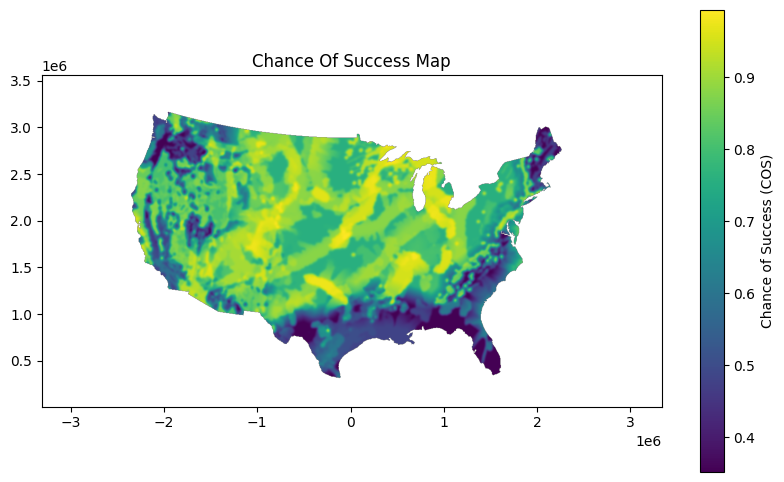

In [1]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np



# Open the raster file
with rasterio.open('zip_files/02_SC_COS_unzipped/02_SC_COS/cos_sc.asc') as src:
    cos_data = src.read(1)
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
print(cos_data.shape)

print(cos_data[:5, :5])
print("unique values in cos_data:", np.unique(cos_data))

masked_cos_data = np.ma.masked_where(cos_data == -9999, cos_data)

plt.figure(figsize=(10, 6))
plt.imshow(masked_cos_data, extent=extent, cmap='viridis')
plt.colorbar(label='Chance of Success (COS)')
plt.title('Chance Of Success Map')
plt.show()

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_cos_area(cos_data, extent, latlon_bounds, stat='all'):
    """
    Visualize COS statistics in a user-defined area, showing the full map with a highlighted rectangle.

    Parameters:
        cos_data (np.ndarray or np.ma.MaskedArray): The COS raster data (masked for -9999).
        extent (list): [min_lon, max_lon, min_lat, max_lat] of the raster.
        latlon_bounds (tuple): (min_lon, max_lon, min_lat, max_lat) for the area of interest.
        stat (str): 'max', 'min', 'mean', or 'all' (default: 'all').
    """
    min_lon, max_lon, min_lat, max_lat = latlon_bounds
    raster_min_lon, raster_max_lon, raster_min_lat, raster_max_lat = extent

    # Calculate pixel indices for the area of interest
    nrows, ncols = cos_data.shape
    lon = np.linspace(raster_min_lon, raster_max_lon, ncols)
    lat = np.linspace(raster_min_lat, raster_max_lat, nrows)

    # Find indices within the bounds
    lon_mask = (lon >= min_lon) & (lon <= max_lon)
    lat_mask = (lat >= min_lat) & (lat <= max_lat)

    # Get the subregion
    sub_cos = cos_data[np.ix_(lat_mask, lon_mask)]

    # Compute statistics
    stats = {}
    if stat in ['max', 'all']:
        stats['max'] = np.nanmax(sub_cos)
    if stat in ['min', 'all']:
        stats['min'] = np.nanmin(sub_cos)
    if stat in ['mean', 'all']:
        stats['mean'] = np.nanmean(sub_cos)

    #Add the main heatmap 
    fig.add_trace(go.Heatmap(
        z= cos_data,
        colorscale='viridis',
        colorbar=dict(title='Chance of Success (COS)'),
        x0=extent[0],
        dx=(extent[1] - extent[0]) / cos_data.shape[1],
        y0=extent[2],
        dy=(extent[3] - extent[2]) / cos_data.shape[0],
        name='COS Data'
    ))

    # Add rectangle for area of interest
    fig.add_shape(
        type="rect",
        x0=min_lon, y0=min_lat, x1=max_lon, y1=max_lat,
        line=dict(color="red", width=2),
        fillcolor="rgba(255,0,0,0.1)",
        name="Area of Interest"
    )
    # Add statistics annotations
    y_annot = max_lat - (max_lat - min_lat) * 0.1
    for i, (k, v) in enumerate(stats.items()):
        fig.add_annotation(
            x=min_lon,
            y=y_annot - i*0.05*(max_lat-min_lat),
            text=f"{k}: {v:.3f}",
            showarrow=False,
            font=dict(color="white", size=12),
            bgcolor="rgba(0,0,0,0.7)",
            bordercolor="white",
            borderwidth=1
        )

    # Plot full map
    plt.figure(figsize=(10, 6))
    plt.imshow(cos_data, extent=extent, cmap='viridis')
    plt.colorbar(label='Chance of Success (COS)')
    plt.title('COS Map (Area Highlighted)')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # Draw rectangle for area of interest
    rect = plt.Rectangle((min_lon, min_lat), max_lon-min_lon, max_lat-min_lat,
                         linewidth=2, edgecolor='red', facecolor='none')
    plt.gca().add_patch(rect)
    # Do NOT zoom in; show full map
    plt.xlim(raster_min_lon, raster_max_lon)
    plt.ylim(raster_min_lat, raster_max_lat)

    # Annotate statistics
    y_annot = max_lat - (max_lat - min_lat) * 0.1
    for i, (k, v) in enumerate(stats.items()):
        plt.text(min_lon, y_annot - i*0.05*(max_lat-min_lat), f"{k}: {v:.3f}", color='white', fontsize=12, bbox=dict(facecolor='black', alpha=0.5))

    plt.show()
    return stats

latlon_bounds = (-1200000, -1000000, 1000000, 2000000)  # Replace with your area of interest
stats = visualize_cos_area(masked_cos_data, extent, latlon_bounds, stat='all')
print(stats)

NameError: name 'fig' is not defined

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go 
import numpy as np 
from plotly.subplots import make_subplots

# Create interactive heatmap with Plotly
z = np.flipud(masked_cos_data.filled(np.nan))
zmin = np.nanmin(z)
zmax = np.nanmax(z)
fig = go.Figure(data=go.Heatmap(
      z=z,
      colorscale='viridis',
      colorbar=dict(title='Chance of Success (COS)'),
      x0=extent[0],
      dx=(extent[1] - extent[0]) / z.shape[1],
      y0=extent[2],
      dy=(extent[3] - extent[2]) / z.shape[0],
      zmin=zmin,
      zmax=zmax
  ))
fig.update_layout(
    title='Chance Of Success Map',
    xaxis_title='Longitude',
    yaxis_title='Latitude',
    width=800,
    height=500
)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go 
import numpy as np 
from plotly.subplots import make_subplots

def visualize_cos_area(cos_data, extent, latlon_bounds, stat='all'):
    """
    Visualize COS statistics in a user-defined area, showing the full map with a highlighted rectangle.

    Parameters:
        cos_data (np.ndarray or np.ma.MaskedArray): The COS raster data (masked for -9999).
        extent (list): [min_lon, max_lon, min_lat, max_lat] of the raster.
        latlon_bounds (tuple): (min_lon, max_lon, min_lat, max_lat) for the area of interest.
        stat (str): 'max', 'min', 'mean', or 'all' (default: 'all').
    """
    min_lon, max_lon, min_lat, max_lat = latlon_bounds
    raster_min_lon, raster_max_lon, raster_min_lat, raster_max_lat = extent

    # Calculate pixel indices for the area of interest
    nrows, ncols = cos_data.shape
    lon = np.linspace(raster_min_lon, raster_max_lon, ncols)
    lat = np.linspace(raster_min_lat, raster_max_lat, nrows)

    # Find indices within the bounds
    lon_mask = (lon >= min_lon) & (lon <= max_lon)
    lat_mask = (lat >= min_lat) & (lat <= max_lat)
    
    masked_cos_data = np.ma.masked_values(cos_data, -9999)
    # Get the subregion
    sub_cos = cos_data[np.ix_(lat_mask, lon_mask)]

    # Compute statistics
    stats = {}
    if stat in ['max', 'all']:
        stats['max'] = np.nanmax(sub_cos)
    if stat in ['min', 'all']:
        stats['min'] = np.nanmin(sub_cos)
    if stat in ['mean', 'all']:
        stats['mean'] = np.nanmean(sub_cos)

    #Add the main heatmap 
    z = np.flipud(masked_cos_data.filled(np.nan))
    zmin = np.nanmin(z)
    zmax = np.nanmax(z)
    fig = go.Figure(data=go.Heatmap(
      z=z,
      colorscale='viridis',
      colorbar=dict(title='Chance of Success (COS)'),
      x0=extent[0],
      dx=(extent[1] - extent[0]) / z.shape[1],
      y0=extent[2],
      dy=(extent[3] - extent[2]) / z.shape[0],
      zmin=zmin,
      zmax=zmax,
    ))

    # Add rectangle for area of interest
    fig.add_shape(
        type="rect",
        x0=min_lon, y0=min_lat, x1=max_lon, y1=max_lat,
        line=dict(color="red", width=2),
        fillcolor="rgba(255,0,0,0.1)",
        name="Area of Interest"
    )
    
    y_start = max_lat - 0.05 * (max_lat - min_lat)  # Start a little below the top
    y_step = 0.22 * (max_lat - min_lat)             # Step size between annotations

    # Add statistics annotations
    y_annot = max_lat - (max_lat - min_lat) * 0.1
    for i, (k, v) in enumerate(stats.items()):
        fig.add_annotation(
            x=min_lon,
            y=y_start - i * y_step,
            text=f"{k}: {v:.3f}",
            showarrow=False,
            font=dict(color="white", size=12),
            bgcolor="rgba(0,0,0,0.7)",
            bordercolor="white",
            borderwidth=1
        )
    
        fig.update_layout(
        title='COS Map (Area Highlighted)',
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        width=800,
        height=500,
        xaxis=dict(range=[raster_min_lon, raster_max_lon]),
        yaxis=dict(range=[raster_min_lat, raster_max_lat])
    )
    

    fig.show()
    return stats

latlon_bounds = (-1200000, -1000000, 1000000, 2000000)  # Replace with your area of interest
stats = visualize_cos_area(masked_cos_data, extent, latlon_bounds, stat='all')
print(stats)


In [1]:
import numpy as np
import plotly.graph_objects as go
from pyproj import CRS, Transformer


filename = 'zip_files/02_SC_COS_unzipped/02_SC_COS/cos_sc.asc'
# Function to read ASCII grid
def read_ascii_grid(filename, nodata_value=-9999):
    with open(filename) as f:
        # Read header
        header = {}
        for _ in range(6):
            line = f.readline()
            key, value = line.split()
            header[key.lower()] = float(value)
        ncols = int(header['ncols'])
        nrows = int(header['nrows'])
        xllcorner = header['xllcorner']
        yllcorner = header['yllcorner']
        cellsize = header['cellsize']
        nodata = header.get('nodata_value', nodata_value)
        # Read data
        data = np.loadtxt(f)
        data = np.ma.masked_values(data, nodata)
    # Calculate extent: [min_lon, max_lon, min_lat, max_lat]
    extent = [
        xllcorner,
        xllcorner + ncols * cellsize,
        yllcorner,
        yllcorner + nrows * cellsize
    ]
    return data, extent

# Visualization function
def visualize_cos_area(cos_data, extent, latlon_bounds, stat='all'):
    min_lon, max_lon, min_lat, max_lat = latlon_bounds
    raster_min_lon, raster_max_lon, raster_min_lat, raster_max_lat = extent

    # Calculate pixel indices for the area of interest
    nrows, ncols = cos_data.shape
    lon = np.linspace(raster_min_lon, raster_max_lon, ncols)
    lat = np.linspace(raster_min_lat, raster_max_lat, nrows)

    # Find indices within the bounds
    lon_mask = (lon >= min_lon) & (lon <= max_lon)
    lat_mask = (lat >= min_lat) & (lat <= max_lat)

    # Get the subregion
    sub_cos = cos_data[np.ix_(lat_mask, lon_mask)]

    # Compute statistics
    stats = {}
    if stat in ['max', 'all']:
        stats['max'] = np.nanmax(sub_cos)
    if stat in ['min', 'all']:
        stats['min'] = np.nanmin(sub_cos)
    if stat in ['mean', 'all']:
        stats['mean'] = np.nanmean(sub_cos)

    # Prepare data for Densitymapbox
    z = np.flipud(cos_data.filled(np.nan))
    zmin = np.nanmin(z)
    zmax = np.nanmax(z)
    nrows, ncols = z.shape
    lons = np.linspace(extent[0], extent[1], ncols)
    lats = np.linspace(extent[2], extent[3], nrows)
    lon_grid, lat_grid = np.meshgrid(lons, lats)
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    z_flat = z.flatten()
    mask = ~np.isnan(z_flat)
    lat_flat = lat_flat[mask]
    lon_flat = lon_flat[mask]
    z_flat = z_flat[mask]
    proj_str = (
    "+proj=aea +lat_1=29.5 +lat_2=45.5 +lat_0=23 +lon_0=-96 "
    "+x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs"
    )
    crs_proj = CRS.from_proj4(proj_str)
    crs_wgs = CRS.from_epsg(4326)
    transformer = Transformer.from_crs(crs_proj, crs_wgs, always_xy=True)
 

    # Convert all points from projected (meters) to degrees
    lon_deg, lat_deg = transformer.transform(lon_flat, lat_flat)
    print("lat_deg min:", np.min(lat_deg), "max:", np.max(lat_deg))
    print("lon_deg min:", np.min(lon_deg), "max:", np.max(lon_deg))
    print("Number of points:", len(lat_deg))
    
    fig = go.Figure(go.Densitymap(
    lat=lat_deg,
    lon=lon_deg,
    z=z_flat,
    radius=8,
    colorscale='viridis',
    colorbar=dict(title='Chance of Success (COS)'),
    zmin=zmin,
    zmax=zmax,
    opacity=0.7
    ))
    fig.update_layout(
        mapbox_style="open-street-map",
        mapbox_zoom=5,
        mapbox_center={"lat": np.mean(lat_deg), "lon": np.mean(lon_deg)},
        width=800,
        height=500
    )

    # Add rectangle for area of interest (as a Scattermap trace)
    rect_lats = [min_lat, max_lat, max_lat, min_lat, min_lat]
    rect_lons = [min_lon, min_lon, max_lon, max_lon, min_lon]

    rect_lons_deg, rect_lats_deg = transformer.transform(rect_lons, rect_lats)
    fig.add_trace(go.Scattermap(
        lat=rect_lats_deg,
        lon=rect_lons_deg,
        mode='lines',
        line=dict(color='red', width=3),
        name='Area of Interest'
    ))

    # Add statistics annotations (as mapbox annotations are not supported, use layout title)
    stats_text = '<br>'.join([f"{k}: {v:.3f}" for k, v in stats.items()])
    fig.update_layout(
        title=f'COS Map (Area Highlighted)<br>{stats_text}'
    )

    print("Extent:", extent)
    print("Sample latitudes:", lat_flat[:5])
    print("Sample longitudes:", lon_flat[:5])
    print("Sample COS values:", z_flat[:5])
    print("COS min:", np.min(z_flat), "max:", np.max(z_flat), "mean:", np.mean(z_flat))
    print("Sample COS values:", z_flat[:10])

    fig.show()
    return stats


masked_cos_data, extent = read_ascii_grid(filename, nodata_value=-9999)
latlon_bounds = (-1200000, -1000000, 1000000, 2000000)  # Replace with your area of interest
stats = visualize_cos_area(masked_cos_data, extent, latlon_bounds, stat='all')
print(stats)

lat_deg min: 25.094001463354072 max: 49.355092257825966
lon_deg min: -124.72585842653685 max: -67.07875951769263
Number of points: 313108
Extent: [-3309807.8956285, 3335192.1043715, 8363.8109757658, 3558363.810975766]
Sample latitudes: [318801.04651878 318801.04651878 323808.09870496 323808.09870496
 323808.09870496]
Sample longitudes: [-132417.08237549 -127413.31731525 -162439.67273693 -157435.90767669
 -152432.14261645]
Sample COS values: [0.60138  0.60454  0.483863 0.517954 0.547227]
COS min: 0.352 max: 0.993214 mean: 0.7519424719074568
Sample COS values: [0.60138  0.60454  0.483863 0.517954 0.547227 0.56964  0.584944 0.594475
 0.600106 0.6034  ]


{'max': np.float64(0.97751), 'min': np.float64(0.610184), 'mean': np.float64(0.8496557669597989)}


In [2]:
import numpy as np
import plotly.graph_objects as go
from pyproj import CRS, Transformer


filename = 'zip_files/02_SC_COS_unzipped/02_SC_COS/cos_sc.asc'
# Function to read ASCII grid
def read_ascii_grid(filename, nodata_value=-9999):
    with open(filename) as f:
        # Read header
        header = {}
        for _ in range(6):
            line = f.readline()
            key, value = line.split()
            header[key.lower()] = float(value)
        ncols = int(header['ncols'])
        nrows = int(header['nrows'])
        xllcorner = header['xllcorner']
        yllcorner = header['yllcorner']
        cellsize = header['cellsize']
        nodata = header.get('nodata_value', nodata_value)
        # Read data
        data = np.loadtxt(f)
        data = np.ma.masked_values(data, nodata)
    # Calculate extent: [min_lon, max_lon, min_lat, max_lat]
    extent = [
        xllcorner,
        xllcorner + ncols * cellsize,
        yllcorner,
        yllcorner + nrows * cellsize
    ]
    return data, extent

# Visualization function
def visualize_cos_area(cos_data, extent, latlon_bounds, stat='all'):
    """
    Visualize COS statistics in a user-defined area, showing the full map with a highlighted rectangle.

    Parameters:
        cos_data (np.ndarray or np.ma.MaskedArray): The COS raster data (masked for -9999).
        extent (list): [min_lon, max_lon, min_lat, max_lat] of the raster.
        latlon_bounds (tuple): (min_lon, max_lon, min_lat, max_lat) for the area of interest.
        stat (str): 'max', 'min', 'mean', or 'all' (default: 'all').
    """
    min_lon, max_lon, min_lat, max_lat = latlon_bounds
    raster_min_lon, raster_max_lon, raster_min_lat, raster_max_lat = extent

    # Calculate pixel indices for the area of interest
    nrows, ncols = cos_data.shape
    lon = np.linspace(raster_min_lon, raster_max_lon, ncols)
    lat = np.linspace(raster_min_lat, raster_max_lat, nrows)

    # Find indices within the bounds
    lon_mask = (lon >= min_lon) & (lon <= max_lon)
    lat_mask = (lat >= min_lat) & (lat <= max_lat)

    # Get the subregion
    sub_cos = cos_data[np.ix_(lat_mask, lon_mask)]

    # Compute statistics
    stats = {}
    if stat in ['max', 'all']:
        stats['max'] = np.nanmax(sub_cos)
    if stat in ['min', 'all']:
        stats['min'] = np.nanmin(sub_cos)
    if stat in ['mean', 'all']:
        stats['mean'] = np.nanmean(sub_cos)

    # Prepare data for Densitymapbox
    z = np.flipud(cos_data.filled(np.nan))
    zmin = np.nanmin(z)
    zmax = np.nanmax(z)
    nrows, ncols = z.shape
    lons = np.linspace(extent[0], extent[1], ncols)
    lats = np.linspace(extent[2], extent[3], nrows)
    lon_grid, lat_grid = np.meshgrid(lons, lats)
    lat_flat = lat_grid.flatten()
    lon_flat = lon_grid.flatten()
    z_flat = z.flatten()
    mask = ~np.isnan(z_flat)
    lat_flat = lat_flat[mask]
    lon_flat = lon_flat[mask]
    z_flat = z_flat[mask]
    proj_str = (
    "+proj=aea +lat_1=29.5 +lat_2=45.5 +lat_0=23 +lon_0=-96 "
    "+x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs"
    )
    crs_proj = CRS.from_proj4(proj_str)
    crs_wgs = CRS.from_epsg(4326)
    transformer = Transformer.from_crs(crs_proj, crs_wgs, always_xy=True)
 

    # Convert all points from projected (meters) to degrees
    lon_deg, lat_deg = transformer.transform(lon_flat, lat_flat)
    print("lat_deg min:", np.min(lat_deg), "max:", np.max(lat_deg))
    print("lon_deg min:", np.min(lon_deg), "max:", np.max(lon_deg))
    print("Number of points:", len(lat_deg))

    
    
    fig = go.Figure(go.Scattermap(
    lat=lat_deg,
    lon=lon_deg,
    mode='markers',
    marker=dict(
        size=6,  # Small size for dense grid
        color=z_flat,
        colorscale='Viridis',
        colorbar=dict(title='Chance of Success (COS)'),
        opacity=0.5
    ),
    hovertemplate="<b>Latitude:</b> %{lat:.6f}°<br><b>Longitude:</b> %{lon:.6f}°<br><b>COS Value:</b> %{marker.color:.4f}<extra></extra>"
        ))
    fig.update_layout(
        mapbox_style="open-street-map",
        mapbox_zoom=3,
        mapbox_center={"lat": np.mean(lat_deg), "lon": np.mean(lon_deg)},
        width=800,
        height=500
    )

    # Add rectangle for area of interest (as a Scattermap trace)
    rect_lats = [min_lat, max_lat, max_lat, min_lat, min_lat]
    rect_lons = [min_lon, min_lon, max_lon, max_lon, min_lon]

    rect_lons_deg, rect_lats_deg = transformer.transform(rect_lons, rect_lats)
    fig.add_trace(go.Scattermap(
        lat=rect_lats_deg,
        lon=rect_lons_deg,
        mode='lines',
        line=dict(color='red', width=3),
        name='Area of Interest'
    ))

    # Add statistics annotations (as mapbox annotations are not supported, use layout title)
    stats_text = '<br>'.join([f"{k}: {v:.3f}" for k, v in stats.items()])
    fig.update_layout(
        title=f'COS Map (Area Highlighted)<br>{stats_text}'
    )

    print("Extent:", extent)
    print("Sample latitudes:", lat_flat[:5])
    print("Sample longitudes:", lon_flat[:5])
    print("Sample COS values:", z_flat[:5])
    print("COS min:", np.min(z_flat), "max:", np.max(z_flat), "mean:", np.mean(z_flat))
    print("Sample COS values:", z_flat[:10])

    fig.show()
    return stats


masked_cos_data, extent = read_ascii_grid(filename, nodata_value=-9999)
latlon_bounds = (-1200000, -1000000, 1000000, 2000000)  # Replace with your area of interest
stats = visualize_cos_area(masked_cos_data, extent, latlon_bounds, stat='all')
print(stats)


lat_deg min: 25.094001463354072 max: 49.355092257825966
lon_deg min: -124.72585842653685 max: -67.07875951769263
Number of points: 313108
Extent: [-3309807.8956285, 3335192.1043715, 8363.8109757658, 3558363.810975766]
Sample latitudes: [318801.04651878 318801.04651878 323808.09870496 323808.09870496
 323808.09870496]
Sample longitudes: [-132417.08237549 -127413.31731525 -162439.67273693 -157435.90767669
 -152432.14261645]
Sample COS values: [0.60138  0.60454  0.483863 0.517954 0.547227]
COS min: 0.352 max: 0.993214 mean: 0.7519424719074568
Sample COS values: [0.60138  0.60454  0.483863 0.517954 0.547227 0.56964  0.584944 0.594475
 0.600106 0.6034  ]


{'max': np.float64(0.97751), 'min': np.float64(0.610184), 'mean': np.float64(0.8496557669597989)}
